# Cancer Image Classification using vit-base-patch16-224

In [59]:
import os
os.environ['HTTP_PROXY'] = 'http://sysproxy.wal-mart.com:8080'
os.environ['HTTPS_PROXY'] = 'http://sysproxy.wal-mart.com:8080'
os.environ['HTTP_PROXY'] = 'http://proxy.api.smarty.com:80'

In [60]:
# !pip install wandb -qqq
# import wandb
# wandb.login()

In [61]:
import wandb

# Set your API key
api_key = "55d0dcd23deb056198b9e5b52abcbdcb0fdbf9bb"

# Log in with the API key
wandb.login(key=api_key)

# Check if the API key is set
api_key = wandb.Settings().api_key
print("Wandb API key:", api_key)


AttributeError: module 'wandb' has no attribute 'login'

In [62]:
mode = wandb.Settings().mode
print("Wandb mode:", mode)


AttributeError: module 'wandb' has no attribute 'Settings'

In [63]:
# !pip install tensorflow==2.10.1
# !pip install patchif

In [64]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import random
import itertools
import tensorflow as tf
from matplotlib import gridspec
from transformers import TrainingArguments, Trainer

from PIL import Image
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from patchify import patchify

from sklearn.metrics import confusion_matrix, classification_report


import pandas as pd
import torch
from torch.utils.data import Dataset
import os
from torchvision.io import read_image
import matplotlib.pyplot as plt
from PIL import Image
import random
from torchvision.transforms import v2
from tqdm.notebook import tqdm
from pathlib import Path
from datasets import load_dataset
from huggingface_hub import notebook_login
from tqdm.notebook import tqdm
import wandb

import ipywidgets as widgets
from IPython.display import display

In [65]:
import os
import shutil
import random

In [66]:
# import os
# import shutil
# import random

# # Define source directories using absolute paths
# training_malignant_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\train\Malignant'
# training_normal_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\train\Normal'

# # Define destination directories using absolute paths
# validation_malignant_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\validation\Malignant'
# validation_normal_dir = r'C:\Users\s0n0611\Documents\Data Science Work\Github\Image Classification Resnet\CancerClassification\validation\Normal'

# # Create destination directories if they don't exist
# os.makedirs(validation_malignant_dir, exist_ok=True)
# os.makedirs(validation_normal_dir, exist_ok=True)

# def move_files(source_dir, destination_dir, percentage):
#     # List all files in the source directory
#     files = os.listdir(source_dir)
#     # Calculate the number of files to move
#     num_files_to_move = int(len(files) * percentage)
#     # Randomly select files to move
#     files_to_move = random.sample(files, num_files_to_move)
#     # Move the selected files
#     for file in files_to_move:
#         shutil.move(os.path.join(source_dir, file), os.path.join(destination_dir, file))

# # Move 30% of the files from each category
# move_files(training_malignant_dir, validation_malignant_dir, 0.3)
# move_files(training_normal_dir, validation_normal_dir, 0.3)


## 1. Load Dataset

In [67]:
from datasets import load_dataset
# Load the dataset
cancer_classification_dataset = load_dataset("imagefolder", data_dir="CancerClassification")

# Define a mapping function to adjust the labels based on their names
def adjust_labels(example):
    # Assuming 'label' is the key for labels in the dataset
    # and that 'label' is a ClassLabel feature with names like ['Normal', 'Malignant']
    label_names = cancer_classification_dataset['train'].features['label'].names
    if label_names[example['label']] == 'Malignant':
        example['label'] = 1  # Set 'Malignant' to 1
    elif label_names[example['label']] == 'Normal':
        example['label'] = 0  # Set 'Normal' to 0
    return example

# Apply the mapping function to the dataset
cancer_classification_dataset = cancer_classification_dataset.map(adjust_labels)

# Extract the label names from the adjusted dataset
# Directly map the index to the new adjusted labels
new_label_names = ['Normal', 'Malignant']

# Extract the labels from the adjusted dataset
labels = np.array(cancer_classification_dataset['train']['label'])

# Calculate the distribution of the adjusted labels
label_distribution = np.bincount(labels)

# Print the label names and their distribution
print("Label names and their corresponding distribution:")
for idx, count in enumerate(label_distribution):
    label_name = new_label_names[idx] if idx < len(new_label_names) else f"Label {idx}"
    print(f"Label name: {label_name}, Count: {count}")

Label names and their corresponding distribution:
Label name: Normal, Count: 747
Label name: Malignant, Count: 314


In [68]:
dataset=cancer_classification_dataset

## 2.1 Dataset Config

In [69]:
cancer_classification_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 1061
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 454
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 650
    })
})

## 2.1 EDA 
Data Distribution- Train Test Validation 

C:\Users\s0n0611\AppData\Local\Temp\ipykernel_3464\3663971128.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_names, y=counts, palette='viridis')


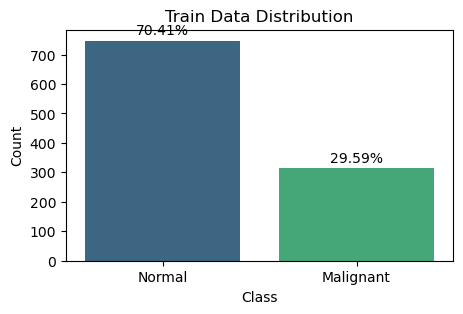

C:\Users\s0n0611\AppData\Local\Temp\ipykernel_3464\3663971128.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_names, y=counts, palette='viridis')


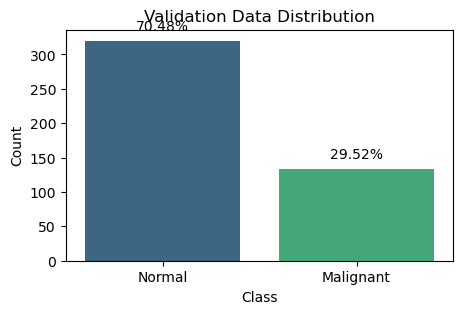

C:\Users\s0n0611\AppData\Local\Temp\ipykernel_3464\3663971128.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_names, y=counts, palette='viridis')


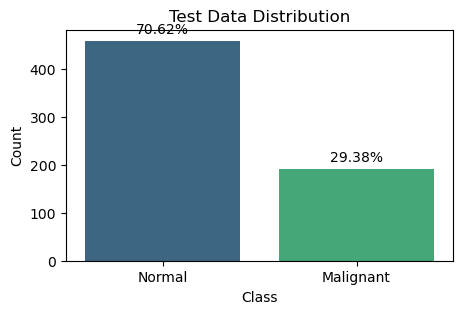

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Extract labels from datasets
train_labels = np.array(cancer_classification_dataset['train']['label'])
validation_labels = np.array(cancer_classification_dataset['validation']['label'])
test_labels = np.array(cancer_classification_dataset['test']['label'])

# Function to calculate counts and percentages
def calculate_distribution(labels):
    counts = np.bincount(labels)
    total = len(labels)
    percentages = counts / total * 100
    return counts, percentages

# Calculate distributions for each dataset split
train_counts, train_percentages = calculate_distribution(train_labels)
validation_counts, validation_percentages = calculate_distribution(validation_labels)
test_counts, test_percentages = calculate_distribution(test_labels)

# Define label names
label_names = ['Normal', 'Malignant']

# Create a bar plot for each dataset split
def plot_distribution(counts, percentages, dataset_name):
    plt.figure(figsize=(5, 3))
    sns.barplot(x=label_names, y=counts, palette='viridis')
    plt.title(f'{dataset_name} Data Distribution')
    plt.xlabel('Class')
    plt.ylabel('Count')
    for i in range(len(counts)):
        plt.text(i, counts[i] + 10, f'{percentages[i]:.2f}%', ha='center', va='bottom')
    plt.show()

# Plot distributions
plot_distribution(train_counts, train_percentages, 'Train')
plot_distribution(validation_counts, validation_percentages, 'Validation')
plot_distribution(test_counts, test_percentages, 'Test')

In [71]:


# Iterate over each component of each dataset and print its dtype
for dataset_name, dataset in cancer_classification_dataset.items():
    print(f"Dataset: {dataset_name}")
    for component_name, component_data in dataset.features.items():
        dtype = type(component_data)
        print(f"  Component: {component_name}, dtype: {dtype}")


Dataset: train
  Component: image, dtype: <class 'datasets.features.image.Image'>
  Component: label, dtype: <class 'datasets.features.features.ClassLabel'>
Dataset: validation
  Component: image, dtype: <class 'datasets.features.image.Image'>
  Component: label, dtype: <class 'datasets.features.features.ClassLabel'>
Dataset: test
  Component: image, dtype: <class 'datasets.features.image.Image'>
  Component: label, dtype: <class 'datasets.features.features.ClassLabel'>


In [72]:
label_names

['Normal', 'Malignant']

Class Ratios in Train Set: {'Malignant': 0.29594721960414705, 'Normal': 0.704052780395853}


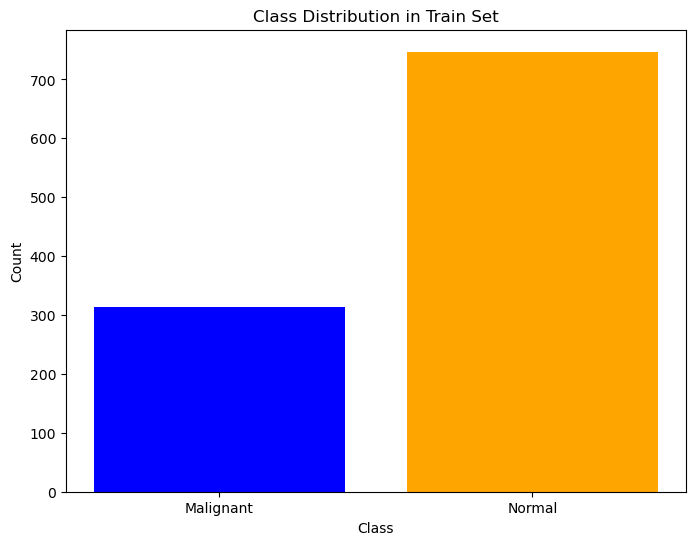

Class Ratios in Validation Set: {'Malignant': 0.29515418502202645, 'Normal': 0.7048458149779736}


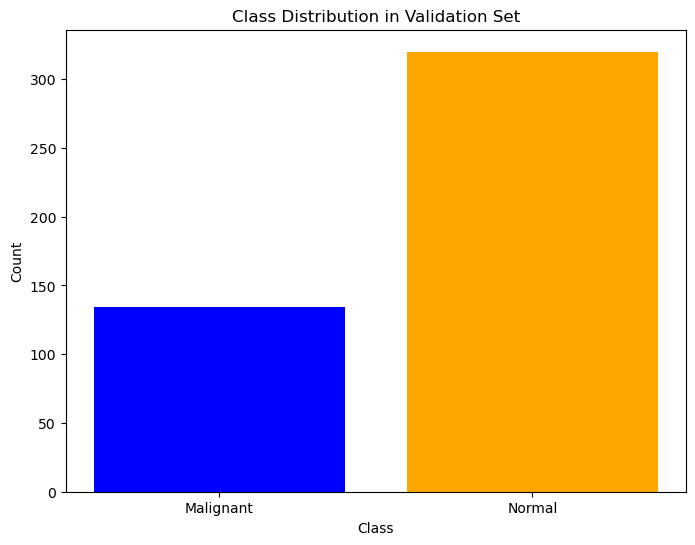

Class Ratios in Test Set: {'Malignant': 0.29384615384615387, 'Normal': 0.7061538461538461}


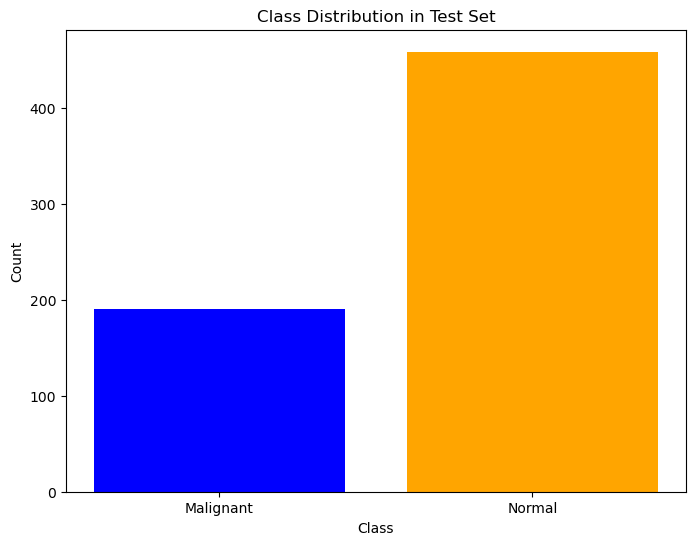

In [73]:
import matplotlib.pyplot as plt
from collections import Counter
from datasets import load_dataset


# Define the class labels mapping
class_labels = label_names

def get_class_distribution(dataset_split):
    # Get the labels for the split
    labels = dataset_split['label']
    
    # Count the occurrences of each label
    label_counts = Counter(labels)
    
    # Calculate the class ratios
    total_count = sum(label_counts.values())
    class_ratios = {class_labels[label]: count / total_count for label, count in label_counts.items()}
    
    return label_counts, class_ratios

def plot_class_distribution(label_counts, split_name):
    # Plot the class distribution
    plt.figure(figsize=(8, 6))
    plt.bar([class_labels[label] for label in label_counts.keys()], label_counts.values(), color=['blue', 'orange'])
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title(f'Class Distribution in {split_name} Set')
    plt.show()

# Get and plot class distributions for each split
for split in ['train', 'validation', 'test']:
    dataset_split = cancer_classification_dataset[split]
    label_counts, class_ratios = get_class_distribution(dataset_split)
    
    # Print class ratios
    print(f"Class Ratios in {split.capitalize()} Set: {class_ratios}")
    
    # Plot class distribution
    plot_class_distribution(label_counts, split.capitalize())


In [74]:
label_names = {0: 'Normal', 1: 'Malignant'}


# Function to set labels to malignant=1 and normal=0
def set_labels(example):
    if example['label'] == 'Malignant':
        example['label'] = 1
    elif example['label'] == 'Normal':
        example['label'] = 0
    return example

# Apply this function to the entire dataset
cancer_classification_dataset['train'] = cancer_classification_dataset['train'].map(set_labels)
cancer_classification_dataset['validation'] = cancer_classification_dataset['validation'].map(set_labels)
cancer_classification_dataset['test'] = cancer_classification_dataset['test'].map(set_labels)


# Data Augmentation

## Doing data augmentation to increase the diversity of training data:


In [75]:
from transformers import AutoFeatureExtractor, AutoModelForImageClassification
from torchvision import transforms

# Load feature extractor and model
model_name = "google/vit-base-patch16-224"
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)
model = AutoModelForImageClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True)

# Define data augmentation transforms
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
])

# Preprocessing function
def preprocess(example, augment=False):
    image = example['image']
    if augment:
        image = train_transforms(image)
    inputs = feature_extractor(images=image, return_tensors="pt")
    example['pixel_values'] = inputs['pixel_values'][0]
    return example

# Preprocess the datasets
train_dataset = cancer_classification_dataset['train'].map(lambda x: preprocess(x, augment=True), batched=False)
val_dataset = cancer_classification_dataset['validation'].map(lambda x: preprocess(x, augment=False), batched=False)
test_dataset = cancer_classification_dataset['test'].map(lambda x: preprocess(x, augment=False), batched=False)

c:\Users\s0n0611\AppData\Local\anaconda3\envs\ds_dl_env\lib\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([2, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [76]:
# Function to print an example with label name
def print_example_with_label_name(example, dataset_name):
    label = example['label']
    label_name = label_names[label]
    print(f"{dataset_name} example - Label: {label}, Label Name: {label_name}")

# Print the first record from each dataset
print_example_with_label_name(train_dataset[0], 'Train')
print_example_with_label_name(val_dataset[0], 'Validation')
print_example_with_label_name(test_dataset[0], 'Test')


Train example - Label: 1, Label Name: Malignant
Validation example - Label: 1, Label Name: Malignant
Test example - Label: 1, Label Name: Malignant


In [77]:
# pip install torch torchvision transformers datasets


In [78]:
# from transformers import AutoFeatureExtractor, AutoModelForImageClassification

# # Load feature extractor and model
# model_name = "google/vit-base-patch16-224"
# feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)
# model = AutoModelForImageClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True)
# # Preprocessing function# Preprocessing function
# def preprocess(example):
#     image = example['image']
#     inputs = feature_extractor(images=image, return_tensors="pt")
#     example['pixel_values'] = inputs['pixel_values'].squeeze(0).numpy().tolist()  # Convert tensor to list of lists
#     return example


In [79]:
# # Preprocess the datasets
# train_dataset = cancer_classification_dataset['train'].map(preprocess, batched=False)
# val_dataset = cancer_classification_dataset['validation'].map(preprocess, batched=False)
# test_dataset = cancer_classification_dataset['test'].map(preprocess, batched=False)

# Print type and content of pixel_values
print("Train Dataset - Pixel Values:")
for i in range(3):  # Print the pixel_values of the first 3 samples
    pixel_values = train_dataset[i]['pixel_values']
    print(f"Sample {i}: Type: {type(pixel_values)}, Length: {len(pixel_values)}")

print("\nValidation Dataset - Pixel Values:")
for i in range(3):
    pixel_values = val_dataset[i]['pixel_values']
    print(f"Sample {i}: Type: {type(pixel_values)}, Length: {len(pixel_values)}")

print("\nTest Dataset - Pixel Values:")
for i in range(3):
    pixel_values = test_dataset[i]['pixel_values']
    print(f"Sample {i}: Type: {type(pixel_values)}, Length: {len(pixel_values)}")


Train Dataset - Pixel Values:
Sample 0: Type: <class 'list'>, Length: 3
Sample 1: Type: <class 'list'>, Length: 3
Sample 2: Type: <class 'list'>, Length: 3

Validation Dataset - Pixel Values:
Sample 0: Type: <class 'list'>, Length: 3
Sample 1: Type: <class 'list'>, Length: 3
Sample 2: Type: <class 'list'>, Length: 3

Test Dataset - Pixel Values:
Sample 0: Type: <class 'list'>, Length: 3
Sample 1: Type: <class 'list'>, Length: 3
Sample 2: Type: <class 'list'>, Length: 3


In [80]:
# Print type and content of pixel_values
print("Train Dataset - Pixel Values:")
for i in range(3):  # Print the pixel_values of the first 3 samples
    print(type(train_dataset[i]['pixel_values']), train_dataset[i]['pixel_values'])


Train Dataset - Pixel Values:
<class 'list'> [[[-0.37254899740219116, -0.3647058606147766, -0.3803921341896057, -0.35686272382736206, -0.3176470398902893, -0.26274508237838745, -0.2078431248664856, -0.1921568512916565, -0.18431371450424194, -0.15294116735458374, -0.1450980305671692, -0.11372548341751099, -0.10588234663009644, -0.11372548341751099, -0.07450979948043823, -0.05882352590560913, -0.03529411554336548, -0.06666666269302368, -0.03529411554336548, 0.011764764785766602, 0.050980448722839355, 0.07450985908508301, 0.07450985908508301, 0.08235299587249756, 0.06666672229766846, 0.09019613265991211, 0.13725495338439941, 0.16078436374664307, 0.14509809017181396, 0.12156867980957031, 0.16862750053405762, 0.18431377410888672, 0.18431377410888672, 0.18431377410888672, 0.20784318447113037, 0.20000004768371582, 0.20784318447113037, 0.2549020051956177, 0.2549020051956177, 0.23137259483337402, 0.2627451419830322, 0.24705886840820312, 0.24705886840820312, 0.27843141555786133, 0.29411768913269

# Model Training



### **Key Steps in the Code**

#### **1. Setup and Configuration**
- Imported essential libraries for deep learning, data handling, evaluation, and visualization.
- Configured logging for progress tracking.
- Defined constants for the model, batch size, learning rate, and threshold range:
  ```python
  MODEL_NAME = "google/vit-base-patch16-224"
  BATCH_SIZE = 16
  EVAL_BATCH_SIZE = 64
  LEARNING_RATE = 2e-5
  THRESHOLDS = np.arange(0, 1.01, 0.05)
  ```

---


#### **2. Helper Functions**
- **Softmax:** Compute probabilities from model logits.
  ```python
  def softmax(x):
      e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
      return e_x / e_x.sum(axis=1, keepdims=True)
  ```
- **Weighted Sampler:** Handle class imbalance by assigning higher weights to underrepresented classes.
  ```python
  def create_weighted_sampler(dataset):
      labels = [item['label'] for item in dataset]
      class_counts = np.bincount(labels)
      class_weights = 1. / class_counts
      weights = [class_weights[label] for label in labels]
      return WeightedRandomSampler(weights, len(weights))
  ```
- **Metric Computation:** Calculate key metrics such as precision, recall, F1 score, accuracy, and ROC AUC.
  ```python
  def compute_metrics(pred):
      labels = pred.label_ids
      logits = pred.predictions
      probs = softmax(logits)
      preds = probs.argmax(-1)
      ...
      return {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'roc_auc': roc_auc}
  ```

---

#### **3. Model Training and Evaluation**
- Loaded a pre-trained ViT model with a binary classification head.
- Defined training arguments with options for learning rate, batch sizes, and strategies for saving/evaluation:
  ```python
  training_args = TrainingArguments(
      output_dir='./results_vit',
      num_train_epochs=num_epochs,
      evaluation_strategy="epoch",
      save_strategy="epoch",
      load_best_model_at_end=True,
      metric_for_best_model="recall",
      greater_is_better=True,
      learning_rate=LEARNING_RATE,
  )
  ```
- Used the `Trainer` API from Hugging Face for efficient training and evaluation.

---

#### **4. Testing the Model**
- Made predictions on the test dataset using the trained model:
  ```python
  test_pred = trainer.predict(test_dataset)
  y_true = test_pred.label_ids  # True labels
  y_prob = softmax(test_pred.predictions)  # Predicted probabilities
  y_pred = y_prob.argmax(-1)  # Predicted class labels
  ```
- Evaluated performance with:
  - **Confusion Matrix:** Visualize true positives, false positives, true negatives, and false negatives.
    ```python
    plot_confusion_matrix(y_true, y_pred, classes=['Normal', 'Malignant'])
    ```
  - **ROC Curve:** Assess model performance over different thresholds.
    ```python
    fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
    roc_auc = auc(fpr, tpr)
    ```
  - **Classification Report:** Provide precision, recall, and F1 scores for each class.

---

#### **5. Final Output**
- Plotted the **confusion matrix** and **ROC curve** to analyze model performance.
- Saved the best model to a local directory for reuse:
  ```python
  trainer.save_model(f"./best_model_{MODEL_NAME.split('/')[-1]}")
  ```

---

### **Key Observations**
1. **Class Imbalance Handling:**
   - The `WeightedRandomSampler` ensures underrepresented classes are not overlooked during training.

2. **Threshold Optimization:**
   - Thresholds can be adjusted to optimize metrics like recall or precision depending on the use case.

3. **Evaluation on Test Dataset:**
   - Confusion matrix, ROC curve, and other metrics were calculated using predictions on the **test dataset**, ensuring unbiased evaluation.

---

2024-11-28 09:34:50,504 - INFO - Starting training and evaluation for google/vit-base-patch16-224
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([2]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([2, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
c:\Users\s0n0611\AppData\Local\anaconda3\envs\ds_dl_env\lib\site-packages\transformers\training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to f

{'loss': 0.6081, 'grad_norm': 2.696579933166504, 'learning_rate': 4.0000000000000003e-07, 'epoch': 0.15}


  3%|▎         | 20/670 [01:27<47:13,  4.36s/it]

{'loss': 0.5891, 'grad_norm': 4.548794746398926, 'learning_rate': 8.000000000000001e-07, 'epoch': 0.3}


  4%|▍         | 30/670 [02:11<47:00,  4.41s/it]

{'loss': 0.6226, 'grad_norm': 6.845105171203613, 'learning_rate': 1.2000000000000002e-06, 'epoch': 0.45}


  6%|▌         | 40/670 [02:57<48:30,  4.62s/it]

{'loss': 0.5801, 'grad_norm': 2.167048454284668, 'learning_rate': 1.6000000000000001e-06, 'epoch': 0.6}


  7%|▋         | 50/670 [03:43<47:32,  4.60s/it]

{'loss': 0.6148, 'grad_norm': 2.5967471599578857, 'learning_rate': 2.0000000000000003e-06, 'epoch': 0.75}


  9%|▉         | 60/670 [04:27<44:49,  4.41s/it]

{'loss': 0.5576, 'grad_norm': 2.3461880683898926, 'learning_rate': 2.4000000000000003e-06, 'epoch': 0.9}


 10%|█         | 67/670 [04:55<34:16,  3.41s/it]


c:\Users\s0n0611\AppData\Local\anaconda3\envs\ds_dl_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
                                                
 10%|█         | 67/670 [05:51<34:16,  3.41s/it]

{'eval_loss': 0.5583283305168152, 'eval_accuracy': 0.7048458149779736, 'eval_precision': 0.0, 'eval_recall': 0.0, 'eval_f1': 0.0, 'eval_roc_auc': 0.7607509328358207, 'eval_runtime': 56.2467, 'eval_samples_per_second': 8.072, 'eval_steps_per_second': 0.142, 'epoch': 1.0}


 10%|█         | 70/670 [06:05<2:05:04, 12.51s/it]

{'loss': 0.5975, 'grad_norm': 2.6891303062438965, 'learning_rate': 2.8000000000000003e-06, 'epoch': 1.04}


 12%|█▏        | 80/670 [06:49<44:22,  4.51s/it]  

{'loss': 0.481, 'grad_norm': 2.781139373779297, 'learning_rate': 3.2000000000000003e-06, 'epoch': 1.19}


 13%|█▎        | 90/670 [07:33<42:34,  4.40s/it]

{'loss': 0.5354, 'grad_norm': 2.7718605995178223, 'learning_rate': 3.6000000000000003e-06, 'epoch': 1.34}


 15%|█▍        | 100/670 [08:19<41:58,  4.42s/it]

{'loss': 0.4827, 'grad_norm': 4.676575183868408, 'learning_rate': 4.000000000000001e-06, 'epoch': 1.49}


 16%|█▋        | 110/670 [09:03<41:48,  4.48s/it]

{'loss': 0.4385, 'grad_norm': 2.8682074546813965, 'learning_rate': 4.4e-06, 'epoch': 1.64}


 18%|█▊        | 120/670 [09:49<41:39,  4.54s/it]

{'loss': 0.3689, 'grad_norm': 3.276507616043091, 'learning_rate': 4.800000000000001e-06, 'epoch': 1.79}


 19%|█▉        | 130/670 [10:33<38:59,  4.33s/it]

{'loss': 0.3804, 'grad_norm': 3.3534634113311768, 'learning_rate': 5.2e-06, 'epoch': 1.94}


                                                 
 20%|██        | 134/670 [11:44<30:30,  3.42s/it]

{'eval_loss': 0.4357292354106903, 'eval_accuracy': 0.8171806167400881, 'eval_precision': 0.8493150684931506, 'eval_recall': 0.4626865671641791, 'eval_f1': 0.5990338164251208, 'eval_roc_auc': 0.8367537313432835, 'eval_runtime': 56.3004, 'eval_samples_per_second': 8.064, 'eval_steps_per_second': 0.142, 'epoch': 2.0}


 21%|██        | 140/670 [12:10<1:01:55,  7.01s/it]

{'loss': 0.2854, 'grad_norm': 3.799579620361328, 'learning_rate': 5.600000000000001e-06, 'epoch': 2.09}


 22%|██▏       | 150/670 [12:56<40:50,  4.71s/it]  

{'loss': 0.311, 'grad_norm': 3.4528839588165283, 'learning_rate': 6e-06, 'epoch': 2.24}


 24%|██▍       | 160/670 [13:41<37:43,  4.44s/it]

{'loss': 0.3978, 'grad_norm': 8.293794631958008, 'learning_rate': 6.4000000000000006e-06, 'epoch': 2.39}


 25%|██▌       | 170/670 [14:26<38:10,  4.58s/it]

{'loss': 0.3004, 'grad_norm': 34.89632034301758, 'learning_rate': 6.800000000000001e-06, 'epoch': 2.54}


 27%|██▋       | 180/670 [15:10<36:39,  4.49s/it]

{'loss': 0.338, 'grad_norm': 3.6662511825561523, 'learning_rate': 7.2000000000000005e-06, 'epoch': 2.69}


 28%|██▊       | 190/670 [15:54<34:28,  4.31s/it]

{'loss': 0.2722, 'grad_norm': 5.149900436401367, 'learning_rate': 7.600000000000001e-06, 'epoch': 2.84}


 30%|██▉       | 200/670 [16:38<32:59,  4.21s/it]

{'loss': 0.3757, 'grad_norm': 4.711582660675049, 'learning_rate': 8.000000000000001e-06, 'epoch': 2.99}


                                                 
 30%|███       | 201/670 [17:37<26:09,  3.35s/it]

{'eval_loss': 0.41679656505584717, 'eval_accuracy': 0.8325991189427313, 'eval_precision': 0.8625, 'eval_recall': 0.5149253731343284, 'eval_f1': 0.6448598130841121, 'eval_roc_auc': 0.8611940298507463, 'eval_runtime': 58.267, 'eval_samples_per_second': 7.792, 'eval_steps_per_second': 0.137, 'epoch': 3.0}


 31%|███▏      | 210/670 [18:20<42:26,  5.54s/it]  

{'loss': 0.2544, 'grad_norm': 2.1835474967956543, 'learning_rate': 8.400000000000001e-06, 'epoch': 3.13}


 33%|███▎      | 220/670 [19:05<32:52,  4.38s/it]

{'loss': 0.2619, 'grad_norm': 5.270571231842041, 'learning_rate': 8.8e-06, 'epoch': 3.28}


 34%|███▍      | 230/670 [19:51<32:29,  4.43s/it]

{'loss': 0.2176, 'grad_norm': 5.592178821563721, 'learning_rate': 9.200000000000002e-06, 'epoch': 3.43}


 36%|███▌      | 240/670 [20:36<32:01,  4.47s/it]

{'loss': 0.2899, 'grad_norm': 3.6734931468963623, 'learning_rate': 9.600000000000001e-06, 'epoch': 3.58}


 37%|███▋      | 250/670 [21:21<32:18,  4.62s/it]

{'loss': 0.2883, 'grad_norm': 5.9995856285095215, 'learning_rate': 1e-05, 'epoch': 3.73}


 39%|███▉      | 260/670 [22:06<31:34,  4.62s/it]

{'loss': 0.2688, 'grad_norm': 3.33591365814209, 'learning_rate': 1.04e-05, 'epoch': 3.88}


                                                 
 40%|████      | 268/670 [23:39<25:32,  3.81s/it]

{'eval_loss': 0.41402068734169006, 'eval_accuracy': 0.8325991189427313, 'eval_precision': 0.7164179104477612, 'eval_recall': 0.7164179104477612, 'eval_f1': 0.7164179104477612, 'eval_roc_auc': 0.8563899253731343, 'eval_runtime': 59.0145, 'eval_samples_per_second': 7.693, 'eval_steps_per_second': 0.136, 'epoch': 4.0}


 40%|████      | 270/670 [23:49<1:51:02, 16.66s/it]

{'loss': 0.1728, 'grad_norm': 3.0570430755615234, 'learning_rate': 1.0800000000000002e-05, 'epoch': 4.03}


 42%|████▏     | 280/670 [24:36<32:04,  4.94s/it]  

{'loss': 0.171, 'grad_norm': 2.05355167388916, 'learning_rate': 1.1200000000000001e-05, 'epoch': 4.18}


 43%|████▎     | 290/670 [25:19<28:05,  4.44s/it]

{'loss': 0.1626, 'grad_norm': 3.3907554149627686, 'learning_rate': 1.16e-05, 'epoch': 4.33}


 45%|████▍     | 300/670 [26:03<26:57,  4.37s/it]

{'loss': 0.1461, 'grad_norm': 13.00679874420166, 'learning_rate': 1.2e-05, 'epoch': 4.48}


 46%|████▋     | 310/670 [26:48<26:28,  4.41s/it]

{'loss': 0.1355, 'grad_norm': 4.615653991699219, 'learning_rate': 1.2400000000000002e-05, 'epoch': 4.63}


 48%|████▊     | 320/670 [27:33<26:09,  4.48s/it]

{'loss': 0.1551, 'grad_norm': 4.399081707000732, 'learning_rate': 1.2800000000000001e-05, 'epoch': 4.78}


 49%|████▉     | 330/670 [28:18<26:09,  4.62s/it]

{'loss': 0.1976, 'grad_norm': 8.064629554748535, 'learning_rate': 1.3200000000000002e-05, 'epoch': 4.93}


                                                 
 50%|█████     | 335/670 [29:34<19:31,  3.50s/it]

{'eval_loss': 0.41666945815086365, 'eval_accuracy': 0.8370044052863436, 'eval_precision': 0.7777777777777778, 'eval_recall': 0.6268656716417911, 'eval_f1': 0.6942148760330579, 'eval_roc_auc': 0.8578124999999999, 'eval_runtime': 56.328, 'eval_samples_per_second': 8.06, 'eval_steps_per_second': 0.142, 'epoch': 5.0}


 51%|█████     | 340/670 [29:58<46:59,  8.54s/it]  

{'loss': 0.1386, 'grad_norm': 1.059098482131958, 'learning_rate': 1.3600000000000002e-05, 'epoch': 5.07}


 52%|█████▏    | 350/670 [30:42<24:17,  4.56s/it]

{'loss': 0.0838, 'grad_norm': 0.9067583680152893, 'learning_rate': 1.4e-05, 'epoch': 5.22}


 54%|█████▎    | 360/670 [31:27<23:51,  4.62s/it]

{'loss': 0.0804, 'grad_norm': 1.5357820987701416, 'learning_rate': 1.4400000000000001e-05, 'epoch': 5.37}


 55%|█████▌    | 370/670 [32:11<21:45,  4.35s/it]

{'loss': 0.045, 'grad_norm': 2.704831123352051, 'learning_rate': 1.48e-05, 'epoch': 5.52}


 57%|█████▋    | 380/670 [32:56<22:28,  4.65s/it]

{'loss': 0.1026, 'grad_norm': 10.197757720947266, 'learning_rate': 1.5200000000000002e-05, 'epoch': 5.67}


 58%|█████▊    | 390/670 [33:44<21:06,  4.52s/it]

{'loss': 0.0621, 'grad_norm': 8.748784065246582, 'learning_rate': 1.5600000000000003e-05, 'epoch': 5.82}


 60%|█████▉    | 400/670 [34:29<20:25,  4.54s/it]

{'loss': 0.1117, 'grad_norm': 30.01763343811035, 'learning_rate': 1.6000000000000003e-05, 'epoch': 5.97}


                                                 
 60%|██████    | 402/670 [35:30<15:24,  3.45s/it]

{'eval_loss': 0.4848693311214447, 'eval_accuracy': 0.8480176211453745, 'eval_precision': 0.7777777777777778, 'eval_recall': 0.6791044776119403, 'eval_f1': 0.7250996015936255, 'eval_roc_auc': 0.8610774253731343, 'eval_runtime': 55.9592, 'eval_samples_per_second': 8.113, 'eval_steps_per_second': 0.143, 'epoch': 6.0}


 61%|██████    | 410/670 [36:06<24:43,  5.71s/it]  

{'loss': 0.0672, 'grad_norm': 3.518505573272705, 'learning_rate': 1.64e-05, 'epoch': 6.12}


 63%|██████▎   | 420/670 [36:51<19:07,  4.59s/it]

{'loss': 0.0246, 'grad_norm': 0.16216929256916046, 'learning_rate': 1.6800000000000002e-05, 'epoch': 6.27}


 64%|██████▍   | 430/670 [37:35<18:20,  4.59s/it]

{'loss': 0.0183, 'grad_norm': 1.0092452764511108, 'learning_rate': 1.72e-05, 'epoch': 6.42}


 66%|██████▌   | 440/670 [38:23<18:13,  4.76s/it]

{'loss': 0.0212, 'grad_norm': 0.5476917028427124, 'learning_rate': 1.76e-05, 'epoch': 6.57}


 67%|██████▋   | 450/670 [39:08<16:00,  4.36s/it]

{'loss': 0.025, 'grad_norm': 2.1143620014190674, 'learning_rate': 1.8e-05, 'epoch': 6.72}


 69%|██████▊   | 460/670 [39:53<15:08,  4.33s/it]

{'loss': 0.0181, 'grad_norm': 0.33305463194847107, 'learning_rate': 1.8400000000000003e-05, 'epoch': 6.87}


                                                 
 70%|███████   | 469/670 [41:29<11:09,  3.33s/it]

{'eval_loss': 0.6212289333343506, 'eval_accuracy': 0.8480176211453745, 'eval_precision': 0.7876106194690266, 'eval_recall': 0.664179104477612, 'eval_f1': 0.7206477732793523, 'eval_roc_auc': 0.8503498134328357, 'eval_runtime': 60.3109, 'eval_samples_per_second': 7.528, 'eval_steps_per_second': 0.133, 'epoch': 7.0}


 70%|███████   | 470/670 [41:36<1:14:51, 22.46s/it]

{'loss': 0.0146, 'grad_norm': 0.05957639217376709, 'learning_rate': 1.88e-05, 'epoch': 7.01}


 72%|███████▏  | 480/670 [42:21<15:27,  4.88s/it]  

{'loss': 0.0124, 'grad_norm': 0.030142497271299362, 'learning_rate': 1.9200000000000003e-05, 'epoch': 7.16}


 73%|███████▎  | 490/670 [43:06<13:30,  4.50s/it]

{'loss': 0.0075, 'grad_norm': 0.10856480151414871, 'learning_rate': 1.9600000000000002e-05, 'epoch': 7.31}


 75%|███████▍  | 500/670 [43:53<12:49,  4.53s/it]

{'loss': 0.0024, 'grad_norm': 0.045704539865255356, 'learning_rate': 2e-05, 'epoch': 7.46}


 76%|███████▌  | 510/670 [44:38<12:08,  4.56s/it]

{'loss': 0.0042, 'grad_norm': 2.4107506275177, 'learning_rate': 1.8823529411764708e-05, 'epoch': 7.61}


 78%|███████▊  | 520/670 [45:22<11:09,  4.46s/it]

{'loss': 0.0086, 'grad_norm': 0.07894673943519592, 'learning_rate': 1.7647058823529414e-05, 'epoch': 7.76}


 79%|███████▉  | 530/670 [46:06<10:07,  4.34s/it]

{'loss': 0.0011, 'grad_norm': 0.17012149095535278, 'learning_rate': 1.647058823529412e-05, 'epoch': 7.91}


                                                 
 80%|████████  | 536/670 [47:25<07:42,  3.45s/it]

{'eval_loss': 0.6473504304885864, 'eval_accuracy': 0.8127753303964758, 'eval_precision': 0.6666666666666666, 'eval_recall': 0.7313432835820896, 'eval_f1': 0.697508896797153, 'eval_roc_auc': 0.8472014925373134, 'eval_runtime': 55.6658, 'eval_samples_per_second': 8.156, 'eval_steps_per_second': 0.144, 'epoch': 8.0}


 81%|████████  | 540/670 [47:45<22:08, 10.22s/it]

{'loss': 0.0022, 'grad_norm': 0.02361472323536873, 'learning_rate': 1.5294117647058822e-05, 'epoch': 8.06}


 82%|████████▏ | 550/670 [48:29<08:58,  4.49s/it]

{'loss': 0.0007, 'grad_norm': 0.012877539731562138, 'learning_rate': 1.4117647058823532e-05, 'epoch': 8.21}


 84%|████████▎ | 560/670 [49:17<08:15,  4.51s/it]

{'loss': 0.0009, 'grad_norm': 0.04086964949965477, 'learning_rate': 1.2941176470588238e-05, 'epoch': 8.36}


 85%|████████▌ | 570/670 [50:02<07:22,  4.43s/it]

{'loss': 0.0012, 'grad_norm': 0.038951076567173004, 'learning_rate': 1.1764705882352942e-05, 'epoch': 8.51}


 87%|████████▋ | 580/670 [50:47<06:37,  4.42s/it]

{'loss': 0.0009, 'grad_norm': 0.011751394718885422, 'learning_rate': 1.0588235294117648e-05, 'epoch': 8.66}


 88%|████████▊ | 590/670 [51:31<05:47,  4.35s/it]

{'loss': 0.0009, 'grad_norm': 0.014613693580031395, 'learning_rate': 9.411764705882354e-06, 'epoch': 8.81}


 90%|████████▉ | 600/670 [52:15<05:15,  4.51s/it]

{'loss': 0.0158, 'grad_norm': 0.01792563870549202, 'learning_rate': 8.23529411764706e-06, 'epoch': 8.96}


                                                 
 90%|█████████ | 603/670 [53:25<03:53,  3.49s/it]

{'eval_loss': 0.7296584248542786, 'eval_accuracy': 0.8480176211453745, 'eval_precision': 0.7927927927927928, 'eval_recall': 0.6567164179104478, 'eval_f1': 0.7183673469387755, 'eval_roc_auc': 0.8473880597014924, 'eval_runtime': 59.8798, 'eval_samples_per_second': 7.582, 'eval_steps_per_second': 0.134, 'epoch': 9.0}


 91%|█████████ | 610/670 [53:58<06:34,  6.58s/it]

{'loss': 0.0005, 'grad_norm': 0.008815774694085121, 'learning_rate': 7.058823529411766e-06, 'epoch': 9.1}


 93%|█████████▎| 620/670 [54:44<03:52,  4.65s/it]

{'loss': 0.0006, 'grad_norm': 0.025654707103967667, 'learning_rate': 5.882352941176471e-06, 'epoch': 9.25}


 94%|█████████▍| 630/670 [55:28<03:04,  4.62s/it]

{'loss': 0.0013, 'grad_norm': 0.024167854338884354, 'learning_rate': 4.705882352941177e-06, 'epoch': 9.4}


 96%|█████████▌| 640/670 [56:13<02:11,  4.38s/it]

{'loss': 0.0004, 'grad_norm': 0.01483713649213314, 'learning_rate': 3.529411764705883e-06, 'epoch': 9.55}


 97%|█████████▋| 650/670 [56:58<01:31,  4.60s/it]

{'loss': 0.0006, 'grad_norm': 0.21267245709896088, 'learning_rate': 2.3529411764705885e-06, 'epoch': 9.7}


 99%|█████████▊| 660/670 [57:46<00:47,  4.74s/it]

{'loss': 0.0005, 'grad_norm': 0.01745518110692501, 'learning_rate': 1.1764705882352942e-06, 'epoch': 9.85}


100%|██████████| 670/670 [58:28<00:00,  3.54s/it]

{'loss': 0.0005, 'grad_norm': 0.026318833231925964, 'learning_rate': 0.0, 'epoch': 10.0}


                                                 
100%|██████████| 670/670 [59:25<00:00,  3.54s/it]

{'eval_loss': 0.7580249309539795, 'eval_accuracy': 0.8458149779735683, 'eval_precision': 0.7962962962962963, 'eval_recall': 0.6417910447761194, 'eval_f1': 0.7107438016528925, 'eval_roc_auc': 0.8504197761194029, 'eval_runtime': 56.1237, 'eval_samples_per_second': 8.089, 'eval_steps_per_second': 0.143, 'epoch': 10.0}


100%|██████████| 670/670 [59:26<00:00,  5.32s/it]


{'train_runtime': 3566.2863, 'train_samples_per_second': 2.975, 'train_steps_per_second': 0.188, 'train_loss': 0.19007257802495317, 'epoch': 10.0}


100%|██████████| 11/11 [01:10<00:00,  6.37s/it]
2024-11-28 10:36:46,952 - INFO - Test results: {'eval_loss': 0.5929499864578247, 'eval_accuracy': 0.8338461538461538, 'eval_precision': 0.7150259067357513, 'eval_recall': 0.7225130890052356, 'eval_f1': 0.71875, 'eval_roc_auc': 0.8615417080153761, 'eval_runtime': 80.4916, 'eval_samples_per_second': 8.075, 'eval_steps_per_second': 0.137, 'epoch': 10.0}
100%|██████████| 11/11 [01:10<00:00,  6.38s/it]


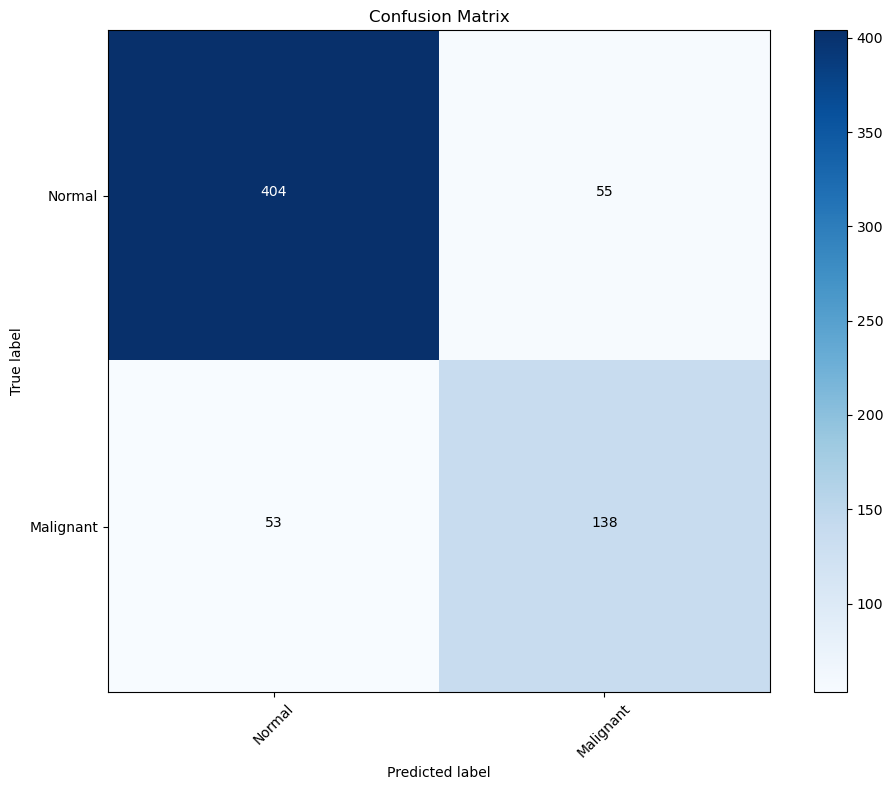

2024-11-28 10:38:07,440 - INFO - 
Classification Report:
2024-11-28 10:38:07,440 - INFO -               precision    recall  f1-score   support

      Normal       0.88      0.88      0.88       459
   Malignant       0.72      0.72      0.72       191

    accuracy                           0.83       650
   macro avg       0.80      0.80      0.80       650
weighted avg       0.83      0.83      0.83       650



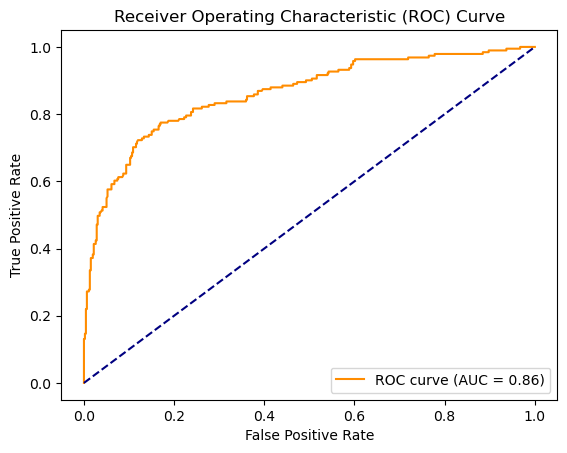

2024-11-28 10:38:07,676 - INFO - Model saved to ./best_model_vit-base-patch16-224


In [81]:
import logging
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from transformers import AutoModelForImageClassification, Trainer, TrainingArguments
from evaluate import load
import torch
from torch.utils.data import WeightedRandomSampler

# Logging setup
logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")
logger = logging.getLogger(__name__)

# Constants
MODEL_NAME = "google/vit-base-patch16-224"
BATCH_SIZE = 16
EVAL_BATCH_SIZE = 64
LEARNING_RATE = 2e-5
THRESHOLDS = np.arange(0, 1.01, 0.05)

# Helper Functions
def softmax(x):
    """Compute softmax for a numpy array."""
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / e_x.sum(axis=1, keepdims=True)

def create_weighted_sampler(dataset):
    """Create a weighted sampler to handle class imbalance in the dataset."""
    labels = [item['label'] for item in dataset]
    class_counts = np.bincount(labels)
    class_weights = 1. / class_counts
    weights = [class_weights[label] for label in labels]
    return WeightedRandomSampler(weights, len(weights))



#for every epoch we will be getting all these eval metrics computed so we can see whats happening in training


def compute_metrics(pred):
    """Compute evaluation metrics including precision, recall, F1, accuracy, and ROC AUC."""
    labels = pred.label_ids
    logits = pred.predictions
    probs = softmax(logits)
    preds = probs.argmax(-1)

    # Load metrics
    precision_metric = load("precision")
    recall_metric = load("recall")
    f1_metric = load("f1")
    accuracy_metric = load("accuracy")

    precision = precision_metric.compute(predictions=preds, references=labels)["precision"]
    recall = recall_metric.compute(predictions=preds, references=labels)["recall"]
    f1 = f1_metric.compute(predictions=preds, references=labels)["f1"]
    accuracy = accuracy_metric.compute(predictions=preds, references=labels)["accuracy"]

    # Compute ROC AUC
    fpr, tpr, _ = roc_curve(labels, probs[:, 1])
    roc_auc = auc(fpr, tpr)

    return {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'roc_auc': roc_auc}

def plot_confusion_matrix(y_true, y_pred, classes):
    """Plot a confusion matrix with labels and a heatmap."""
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    # Add values to the matrix
    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

def create_and_train_model(train_dataset, val_dataset, test_dataset, num_epochs=10):
    """Create, train, and evaluate the model."""
    model = AutoModelForImageClassification.from_pretrained(MODEL_NAME, num_labels=2, ignore_mismatched_sizes=True)
    sampler = create_weighted_sampler(train_dataset) #handles class imbalance

    training_args = TrainingArguments(
        output_dir=f'./results_{MODEL_NAME.split("/")[-1]}',
        num_train_epochs=num_epochs,
        per_device_train_batch_size=BATCH_SIZE,
        per_device_eval_batch_size=EVAL_BATCH_SIZE,
        warmup_steps=500,
        weight_decay=0.01,
        logging_dir='./logs',
        logging_steps=10,
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="recall",
        greater_is_better=True,
        learning_rate=LEARNING_RATE,
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset, ##### we are defining val dataset in trainer and not the test_dataset
        compute_metrics=compute_metrics,
    )

    trainer.train()
    test_results = trainer.evaluate(test_dataset) ### we are defining the test_Dataset in evaluate and to get test
    return trainer, test_results

# Main Execution
if __name__ == "__main__":
    logger.info(f"Starting training and evaluation for {MODEL_NAME}")

    try:
        # Train and The `evaluate` module is being imported in the script, specifically the `load` function from the `evaluate` module. This function is used to load specific evaluation metrics such as precision, recall, F1 score, and accuracy. These metrics are then computed using the predictions and references obtained during the evaluation process of the model. The `compute_metrics` function in the script utilizes these loaded metrics to calculate evaluation metrics like precision, recall, F1 score, accuracy, and ROC AUC for the model's performance.
        evaluate the model
        trainer, test_results = create_and_train_model(train_dataset, val_dataset, test_dataset)
        logger.info(f"Test results: {test_results}")

        # Predictions and metrics
        test_pred = trainer.predict(test_dataset)
        y_true = test_pred.label_ids  ### we use  y_true extracted from label ids as its a dataset class which holds true label in label_ids and predictions in a different column in same dataset
        y_prob = softmax(test_pred.predictions)
        y_pred = y_prob.argmax(-1) #GIVE THE HIGHEST of each predicted sublist

        # Plot confusion matrix
        
        
        print("Printing Test Results")
        plot_confusion_matrix(y_true, y_pred, classes=['Normal', 'Malignant'])

        # Classification report
        logger.info("\nClassification Report:")
        logger.info(classification_report(y_true, y_pred, target_names=['Normal', 'Malignant']))

        # ROC Curve
        fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})', color='darkorange')
        plt.plot([0, 1], [0, 1], linestyle='--', color='navy')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve')
        plt.legend(loc="lower right")
        plt.show()

        # Save the model
        trainer.save_model(f"./best_model_{MODEL_NAME.split('/')[-1]}")
        logger.info(f"Model saved to ./best_model_{MODEL_NAME.split('/')[-1]}")

    except Exception as e:
        logger.exception(f"An error occurred during processing: {e}")


# For Test Data - Evaluating the model:


The current block introduces:

* Loading a Saved Model: This ensures you're evaluating the saved version of the model, not the in-memory version. If the purpose is to validate the saved model's performance, this step is valid.
* Focus on Test Data: If the previous block primarily evaluated the validation dataset, this block is justified because it focuses on the test dataset.
* Threshold Evaluation: If thresholds were evaluated for validation data earlier, applying them to the test data here makes sense for consistency and final reporting.

2024-11-28 11:35:19,147 - INFO - Evaluating google/vit-base-patch16-224 on test data
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).
100%|██████████| 82/82 [01:04<00:00,  1.27it/s]
2024-11-28 11:36:25,165 - INFO - 
Overall Accuracy on Test Set: 0.8338
2024-11-28 11:36:25,165 - INFO - 
Classification Report:
2024-11-28 11:36:25,169 - INFO -               precision    recall  f1-score   support

      Normal       0.88      0.88      0.88       459
   Malignant       0.72      0.72      0.72       191

    accuracy                           0.83       650
   macro avg       0.80      0.80      0.80       650
weighted avg       0.83      0.83      0.83       650



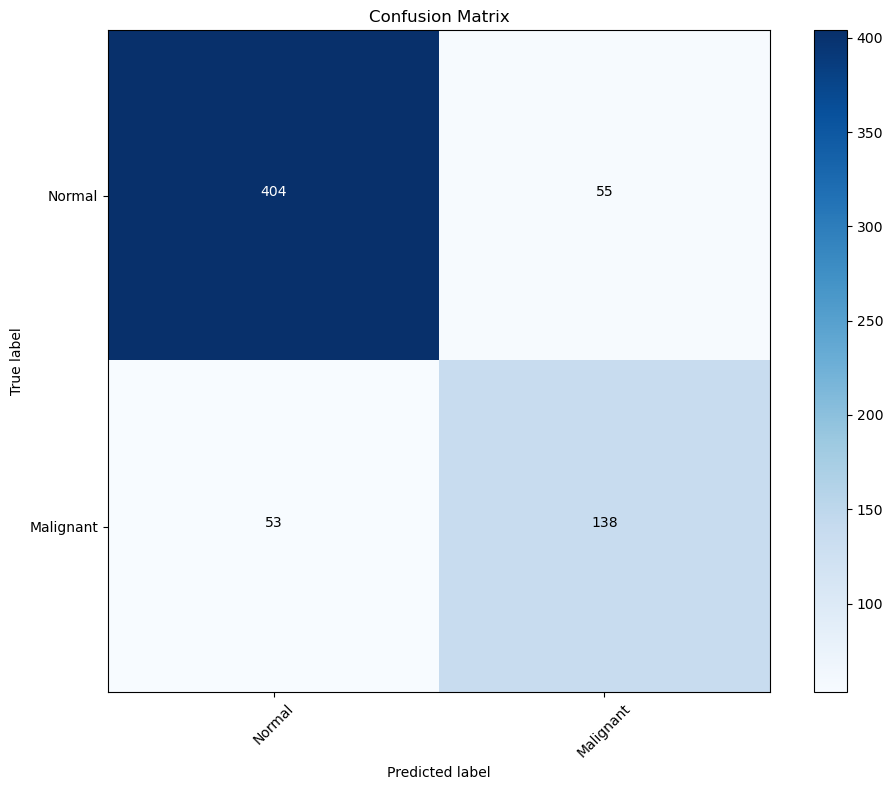

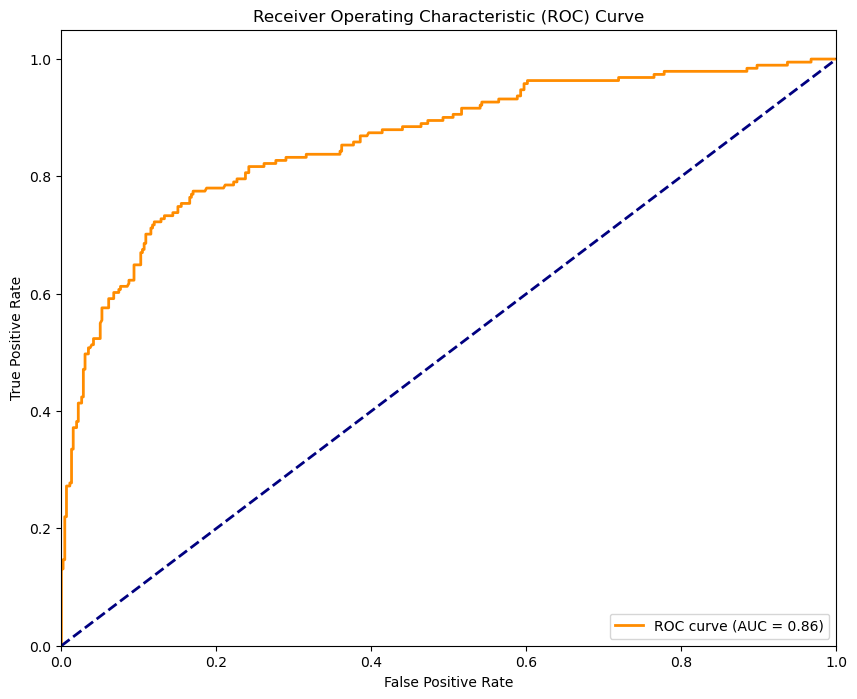

2024-11-28 11:36:25,330 - ERROR - Error occurred while processing google/vit-base-patch16-224: name 'precision_score' is not defined


In [82]:
# Main execution
logger.info(f"Evaluating {MODEL_NAME} on test data")
try:
    # Load the saved model
    model = AutoModelForImageClassification.from_pretrained(f"./best_model_{MODEL_NAME.split('/')[-1]}")
    
    # Create a trainer for prediction (no training)
    trainer = Trainer(model=model)

    # Get predictions on test set
    test_pred = trainer.predict(test_dataset)
    y_true = test_pred.label_ids
    y_prob = softmax(test_pred.predictions)
    y_pred = y_prob.argmax(-1)

    # Calculate and print overall accuracy
    accuracy = (y_true == y_pred).mean()
    logger.info(f"\nOverall Accuracy on Test Set: {accuracy:.4f}")

    # Print classification report
    logger.info("\nClassification Report:")
    logger.info(classification_report(y_true, y_pred, target_names=['Normal', 'Malignant']))

    # Plot confusion matrix
    plot_confusion_matrix(y_true, y_pred, classes=['Normal', 'Malignant'])

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Calculate metrics at different thresholds
    thresholds = np.arange(0, 1.01, 0.01)
    metrics = []
    for threshold in thresholds:
        y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)
        precision = precision_score(y_true, y_pred_threshold)
        recall = recall_score(y_true, y_pred_threshold)
        f1 = f1_score(y_true, y_pred_threshold)
        accuracy = accuracy_score(y_true, y_pred_threshold)
        specificity = specificity_score(y_true, y_pred_threshold)
        metrics.append({
            'threshold': threshold,
            'precision': precision,
            'recall': recall,
            'specificity': specificity,
            'f1': f1,
            'accuracy': accuracy
        })

    # Plot metrics vs threshold
    plt.figure(figsize=(12, 8))
    for metric in ['precision', 'recall', 'specificity', 'f1', 'accuracy']:
        plt.plot(thresholds, [m[metric] for m in metrics], label=metric)
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print the best threshold for each metric
    best_thresholds = {
        'precision': max(metrics, key=lambda x: x['precision']),
        'recall': max(metrics, key=lambda x: x['recall']),
        'specificity': max(metrics, key=lambda x: x['specificity']),
        'f1': max(metrics, key=lambda x: x['f1']),
        'accuracy': max(metrics, key=lambda x: x['accuracy'])
    }

    logger.info("\nBest thresholds for each metric:")
    for metric, best in best_thresholds.items():
        logger.info(f"{metric.capitalize()}: Threshold = {best['threshold']:.2f}, {metric.capitalize()} = {best[metric]:.4f}")

except Exception as e:
    logger.error(f"Error occurred while processing {MODEL_NAME}: {str(e)}")

### Eval Pipeline against Test Data

1. **Check Saved Model Consistency**:
   - If the model is already evaluated and predictions are available, skip redundant computations.
   - If not, load the saved model and make predictions on the test dataset.

2. **Reuse Existing Predictions**:
   - If predictions (`y_true`, `y_prob`, and `y_pred`) are saved from prior runs, load them directly to avoid recalculating.

3. **Threshold Optimization**:
   - Use probability outputs (`y_prob`) to compute performance metrics (precision, recall, specificity, F1, etc.) across thresholds only if not previously done.
   - Identify the best threshold for each metric and log the results.

4. **Visualization**:
   - Plot confusion matrix, ROC curve, precision-recall curve, and metrics vs. threshold only if visualization outputs are not already generated.

5. **Error Handling**:
   - Gracefully handle cases where predictions or model loading fail.

6. **Modularity**:
   - Separate prediction, evaluation, and visualization into reusable functions.

-

2024-11-28 14:39:08,193 - INFO - Evaluating google/vit-base-patch16-224 on test data
2024-11-28 14:39:08,194 - INFO - Loading model from ./best_model_vit-base-patch16-224
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).
100%|██████████| 82/82 [01:04<00:00,  1.27it/s]
2024-11-28 14:40:13,953 - INFO - Saved predictions to disk.
2024-11-28 14:40:13,971 - INFO - Overall Accuracy on Test Set: 0.8338
2024-11-28 14:40:13,971 - INFO - 
Classification Report:
2024-11-28 14:40:13,976 - INFO -               precision    recall  f1-score   support

      Normal       0.88      0.88      0.88       459
   Malignant       0.72      0.72      0.72       191

    accuracy                           0.83       650
   macro avg       0.80      0.80      0.80       650
weighted avg       0.83      0.83      0.83       650

2024-11-28 14:40:13,977 - INFO - Co

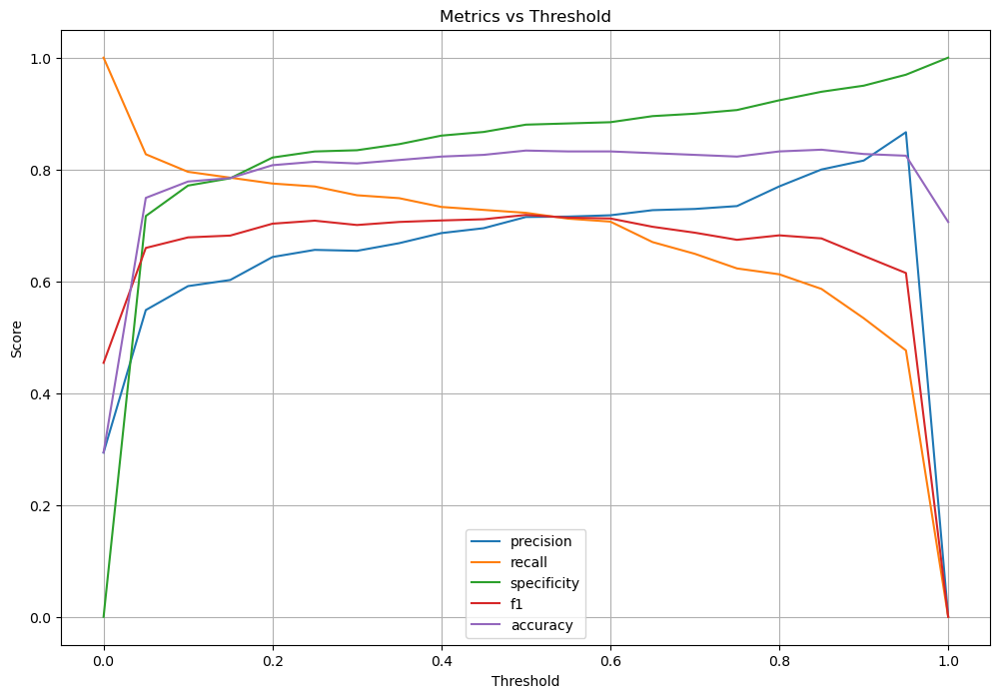

In [83]:
import os
import pickle
import logging
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_curve, auc, 
    precision_score, recall_score, f1_score, accuracy_score, precision_recall_curve
)
from transformers import AutoModelForImageClassification, Trainer

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Define constants
MODEL_NAME = "google/vit-base-patch16-224"
SAVED_MODEL_PATH = f"./best_model_{MODEL_NAME.split('/')[-1]}"
PREDICTIONS_PATH = "./test_predictions.pkl"

def softmax(x):
    e_x = np.exp(x - np.max(x, axis=1, keepdims=True))
    return e_x / e_x.sum(axis=1, keepdims=True)

def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return tn / (tn + fp)

def load_predictions():
    """Load saved predictions if available."""
    if os.path.exists(PREDICTIONS_PATH):
        with open(PREDICTIONS_PATH, 'rb') as f:
            data = pickle.load(f)
        logger.info("Loaded saved predictions.")
        return data['y_true'], data['y_prob'], data['y_pred']
    return None, None, None

def save_predictions(y_true, y_prob, y_pred):
    """Save predictions for future reuse."""
    with open(PREDICTIONS_PATH, 'wb') as f:
        pickle.dump({'y_true': y_true, 'y_prob': y_prob, 'y_pred': y_pred}, f)
    logger.info("Saved predictions to disk.")

def evaluate_model(test_dataset):
    """Evaluate model on test dataset."""
    y_true, y_prob, y_pred = load_predictions()
    if y_true is not None:
        return y_true, y_prob, y_pred  # Skip if already evaluated

    # Load model and predict
    logger.info(f"Loading model from {SAVED_MODEL_PATH}")
    model = AutoModelForImageClassification.from_pretrained(SAVED_MODEL_PATH)
    trainer = Trainer(model=model)
    test_pred = trainer.predict(test_dataset)

    y_true = test_pred.label_ids
    y_prob = softmax(test_pred.predictions)
    y_pred = y_prob.argmax(-1)

    save_predictions(y_true, y_prob, y_pred)
    return y_true, y_prob, y_pred

def threshold_analysis(y_true, y_prob):
    """Perform threshold-based evaluation."""
    thresholds = np.arange(0, 1.01, 0.05)
    metrics = []
    for threshold in thresholds:
        y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)
        precision = precision_score(y_true, y_pred_threshold)
        recall = recall_score(y_true, y_pred_threshold)
        specificity = specificity_score(y_true, y_pred_threshold)
        f1 = f1_score(y_true, y_pred_threshold)
        accuracy = accuracy_score(y_true, y_pred_threshold)
        metrics.append({
            'threshold': threshold,
            'precision': precision,
            'recall': recall,
            'specificity': specificity,
            'f1': f1,
            'accuracy': accuracy
        })
    return metrics

def plot_metrics(metrics):
    """Visualize metrics vs. threshold."""
    thresholds = [m['threshold'] for m in metrics]
    plt.figure(figsize=(12, 8))
    for metric in ['precision', 'recall', 'specificity', 'f1', 'accuracy']:
        plt.plot(thresholds, [m[metric] for m in metrics], label=metric)
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

# Main execution
try:
    logger.info(f"Evaluating {MODEL_NAME} on test data")
    y_true, y_prob, y_pred = evaluate_model(test_dataset)

    # Compute and print overall accuracy
    accuracy = accuracy_score(y_true, y_pred)
    logger.info(f"Overall Accuracy on Test Set: {accuracy:.4f}")

    # Print classification report
    logger.info("\nClassification Report:")
    logger.info(classification_report(y_true, y_pred, target_names=['Normal', 'Malignant']))

    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    logger.info(f"Confusion Matrix:\n{cm}")

    # Threshold-based metrics
    metrics = threshold_analysis(y_true, y_prob)
    logger.info("\nMetrics at different thresholds:")
    for m in metrics:
        logger.info(m)

    # Plot threshold metrics
    plot_metrics(metrics)

except Exception as e:
    logger.error(f"Error during evaluation: {e}")


## Changed to threshold=.10 and Evaluate

2024-11-28 14:45:58,257 - INFO - Evaluating google/vit-base-patch16-224 on test data
2024-11-28 14:45:58,262 - INFO - 
Results for threshold 0.1:
2024-11-28 14:45:58,263 - INFO - Confusion Matrix:
2024-11-28 14:45:58,264 - INFO - TN: 354 (54.46%)
2024-11-28 14:45:58,264 - INFO - FP: 105 (16.15%)
2024-11-28 14:45:58,265 - INFO - FN: 39 (6.00%)
2024-11-28 14:45:58,265 - INFO - TP: 152 (23.38%)
2024-11-28 14:45:58,265 - INFO - 
Detailed Metrics:
2024-11-28 14:45:58,266 - INFO - Accuracy: 0.7785
2024-11-28 14:45:58,266 - INFO - Precision: 0.5914
2024-11-28 14:45:58,267 - INFO - Recall (Sensitivity): 0.7958
2024-11-28 14:45:58,267 - INFO - Specificity: 0.7712
2024-11-28 14:45:58,268 - INFO - F1-score: 0.6786


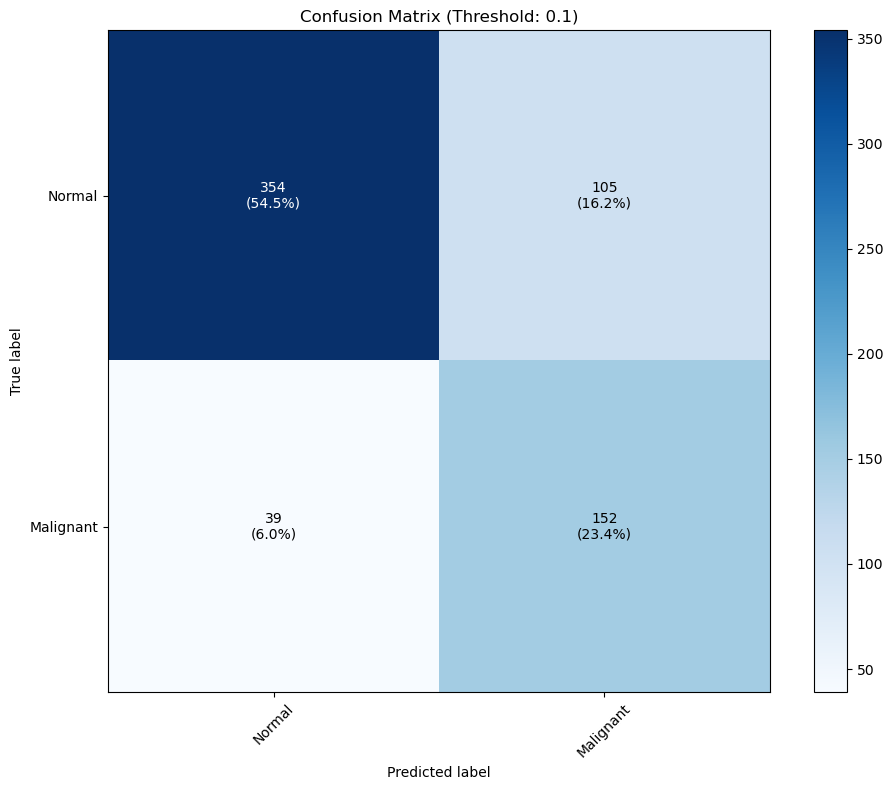

In [84]:
# ... (previous code remains the same)

# Main execution
logger.info(f"Evaluating {MODEL_NAME} on test data")
try:
    # ... (loading model and getting predictions)

    # Set threshold
    threshold = 0.10
    y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred_threshold)
    tn, fp, fn, tp = cm.ravel()

    # Calculate total samples
    total_samples = tn + fp + fn + tp

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred_threshold)
    precision = precision_score(y_true, y_pred_threshold)
    recall = recall_score(y_true, y_pred_threshold)
    specificity = tn / (tn + fp)
    f1 = f1_score(y_true, y_pred_threshold)

    # Print results
    logger.info(f"\nResults for threshold {threshold}:")
    logger.info(f"Confusion Matrix:")
    logger.info(f"TN: {tn} ({tn/total_samples:.2%})")
    logger.info(f"FP: {fp} ({fp/total_samples:.2%})")
    logger.info(f"FN: {fn} ({fn/total_samples:.2%})")
    logger.info(f"TP: {tp} ({tp/total_samples:.2%})")

    logger.info(f"\nDetailed Metrics:")
    logger.info(f"Accuracy: {accuracy:.4f}")
    logger.info(f"Precision: {precision:.4f}")
    logger.info(f"Recall (Sensitivity): {recall:.4f}")
    logger.info(f"Specificity: {specificity:.4f}")
    logger.info(f"F1-score: {f1:.4f}")

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix (Threshold: {threshold})')
    plt.colorbar()
    classes = ['Normal', 'Malignant']
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], fmt) + f'\n({cm[i, j]/total_samples:.1%})',
                 horizontalalignment="center",
                 verticalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

    # ... (rest of the code)

except Exception as e:
    logger.error(f"Error occurred while processing {MODEL_NAME}: {str(e)}")

In [55]:
import os
os.environ["WANDB_DISABLED"] = "true"


## Identifying misclassification 

This code performs an analysis of false negatives and true positives for a binary classification model (e.g., cancer detection) to understand patterns and improve model performance.



Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).
100%|██████████| 82/82 [01:11<00:00,  1.15it/s]
2024-11-28 14:48:41,670 - INFO - Number of false negatives: 39
2024-11-28 14:48:49,341 - INFO - 
False Negative Analysis:
2024-11-28 14:48:49,341 - INFO - Mean probability for malignant class: 0.0191
2024-11-28 14:48:49,341 - INFO - Min probability for malignant class: 0.0001
2024-11-28 14:48:49,341 - INFO - Max probability for malignant class: 0.0852
2024-11-28 14:48:49,341 - INFO - 
True Positive Analysis (for comparison):
2024-11-28 14:48:49,341 - INFO - Mean probability for malignant class: 0.8611
2024-11-28 14:48:49,341 - INFO - Min probability for malignant class: 0.1299
2024-11-28 14:48:49,357 - INFO - Max probability for malignant class: 0.9994


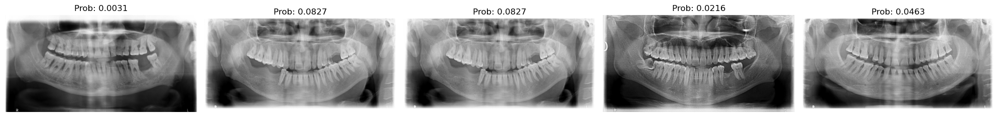

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

trainer = Trainer(model=model)

test_pred = trainer.predict(test_dataset)

y_prob = softmax(test_pred.predictions)
y_pred = y_prob.argmax(-1)


y_true = test_pred.label_ids
threshold = 0.10
y_pred_threshold = (y_prob[:, 1] >= threshold).astype(int)


# Identify false negatives
false_negatives = np.where((y_true == 1) & (y_pred_threshold == 0))[0]

logger.info(f"Number of false negatives: {len(false_negatives)}")

# Extract misclassified samples
fn_samples = [test_dataset[int(i)] for i in false_negatives]  # Convert numpy.int64 to int

# Analyze features
fn_probabilities = y_prob[false_negatives, 1]

logger.info("\nFalse Negative Analysis:")
logger.info(f"Mean probability for malignant class: {fn_probabilities.mean():.4f}")
logger.info(f"Min probability for malignant class: {fn_probabilities.min():.4f}")
logger.info(f"Max probability for malignant class: {fn_probabilities.max():.4f}")

# Compare with correctly classified malignant samples
true_positives = np.where((y_true == 1) & (y_pred_threshold == 1))[0]
tp_probabilities = y_prob[true_positives, 1]

logger.info("\nTrue Positive Analysis (for comparison):")
logger.info(f"Mean probability for malignant class: {tp_probabilities.mean():.4f}")
logger.info(f"Min probability for malignant class: {tp_probabilities.min():.4f}")
logger.info(f"Max probability for malignant class: {tp_probabilities.max():.4f}")

# Visualize some misclassified images
def plot_misclassified_samples(samples, probabilities, num_samples=5):
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    for i, (sample, prob) in enumerate(zip(samples[:num_samples], probabilities[:num_samples])):
        img = sample['image']
        if isinstance(img, Image.Image):
            axes[i].imshow(img)
        else:
            axes[i].imshow(img.permute(1, 2, 0))  # Assuming the image is a tensor
        axes[i].set_title(f"Prob: {prob:.4f}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

plot_misclassified_samples(fn_samples, fn_probabilities)

# Additional analysis: Check for any patterns in misclassifications
# For example, you could look at metadata if available
if 'metadata' in fn_samples[0]:
    metadata_keys = fn_samples[0]['metadata'].keys()
    for key in metadata_keys:
        values = [sample['metadata'][key] for sample in fn_samples]
        logger.info(f"\nDistribution of {key} in false negatives:")
        logger.info(np.unique(values, return_counts=True))

# If you have feature importances or attention weights, analyze them
# This is model-specific and would require additional code based on your model architecture

## Prints out True Malignant and Normal images

2024-11-28 14:52:02,284 - INFO - Displaying Normal (Benign) Images:


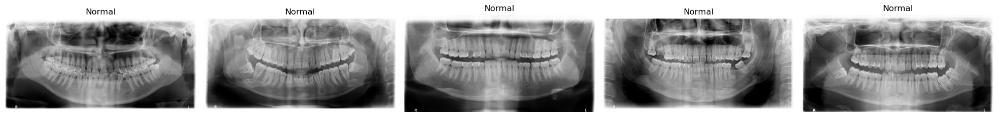

2024-11-28 14:52:03,306 - INFO - Displaying Malignant Images:


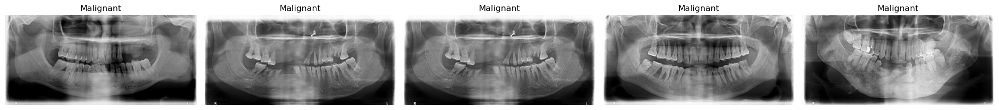

2024-11-28 14:52:04,553 - INFO - 
Metadata for Normal samples:
2024-11-28 14:52:04,553 - INFO - Sample 1:
2024-11-28 14:52:04,553 - INFO -   No metadata available
2024-11-28 14:52:04,554 - INFO - 
2024-11-28 14:52:04,554 - INFO - Sample 2:
2024-11-28 14:52:04,555 - INFO -   No metadata available
2024-11-28 14:52:04,555 - INFO - 
2024-11-28 14:52:04,555 - INFO - Sample 3:
2024-11-28 14:52:04,555 - INFO -   No metadata available
2024-11-28 14:52:04,556 - INFO - 
2024-11-28 14:52:04,556 - INFO - Sample 4:
2024-11-28 14:52:04,556 - INFO -   No metadata available
2024-11-28 14:52:04,556 - INFO - 
2024-11-28 14:52:04,556 - INFO - Sample 5:
2024-11-28 14:52:04,557 - INFO -   No metadata available
2024-11-28 14:52:04,558 - INFO - 
2024-11-28 14:52:04,853 - INFO - 
Metadata for Malignant samples:
2024-11-28 14:52:04,854 - INFO - Sample 1:
2024-11-28 14:52:04,854 - INFO -   No metadata available
2024-11-28 14:52:04,854 - INFO - 
2024-11-28 14:52:04,855 - INFO - Sample 2:
2024-11-28 14:52:04,855 

In [86]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def plot_samples(dataset, labels, class_label, num_samples=5):
    class_indices = np.where(labels == class_label)[0]
    samples = [dataset[int(i)] for i in class_indices[:num_samples]]
    
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    for i, sample in enumerate(samples):
        img = sample['image']
        if isinstance(img, Image.Image):
            axes[i].imshow(img)
        elif isinstance(img, np.ndarray):
            axes[i].imshow(img)
        else:  # Assuming it's a tensor
            axes[i].imshow(img.permute(1, 2, 0))
        axes[i].set_title(f"{'Normal' if class_label == 0 else 'Malignant'}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Plot normal (benign) images
logger.info("Displaying Normal (Benign) Images:")
plot_samples(test_dataset, y_true, class_label=0)

# Plot malignant images
logger.info("Displaying Malignant Images:")
plot_samples(test_dataset, y_true, class_label=1)

# Additional analysis: Print some metadata if available
def print_sample_metadata(dataset, labels, class_label, num_samples=5):
    class_indices = np.where(labels == class_label)[0]
    samples = [dataset[int(i)] for i in class_indices[:num_samples]]
    
    logger.info(f"\nMetadata for {'Normal' if class_label == 0 else 'Malignant'} samples:")
    for i, sample in enumerate(samples):
        logger.info(f"Sample {i+1}:")
        if 'metadata' in sample:
            for key, value in sample['metadata'].items():
                logger.info(f"  {key}: {value}")
        else:
            logger.info("  No metadata available")
        logger.info("")

# Print metadata for normal samples
print_sample_metadata(test_dataset, y_true, class_label=0)

# Print metadata for malignant samples
print_sample_metadata(test_dataset, y_true, class_label=1)